In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
from pyjaspar import jaspardb
from numba import jit, njit, prange
import logomaker
from Bio import SeqIO
from matplotlib.backends.backend_pdf import PdfPages
from tqdm import tqdm
import pandas as pd
import pickle as pk

# Utility functions

In [ ]:
# Function to calculate GC content of a fasta file
# @param path: The path to a fasta-formatted genome
# @return fraction of all bases that are G or C
def calculateGenomeGCContent( path ):
    gc = 0
    at = 0
    for record in SeqIO.parse( path, 'fasta' ):
        s = record.seq.upper()
        gc = gc + s.count('G')
        gc = gc + s.count('C')
        at = at + s.count('A')
        at = at + s.count('T')
    return gc / (gc+at)

In [ ]:
# Function to read in MoDISco PFMs from the output directory
# @param path: the base directory to search for pfms
#   should contain MoDISco outputs from interpreting a single model
# @param task: which task (counts or profile) interpretation
#   to read PFMs from
# @param prefix: prefix to add to the PFM names
def readPFMsFromFolder( path, task='profile', prefix=None ):
    task = task.lower()
    if task not in [ 'profile', 'counts' ]:
        print( 'Invalid task: choose either \'profile\' or \'counts\'' )
        return None
    p = prefix
    if prefix is None:
        p = str(path).strip('/').split('/')[-1]
    pfmpath = os.path.join( path, 'pfms_{0}.npy'.format(task) )
    countpath = os.path.join( path, 'pfms_{0}_n_seqlets.npy'.format(task) )
    inpfms = np.load( pfmpath, allow_pickle=True ).flat[0]
    incounts = np.load( countpath, allow_pickle=True ).flat[0]
    names = []
    outcounts = []
    outpfms = {}
    for pattern in inpfms:
        name = '_'.join([p,task,pattern])
        names.append(name)
        outcounts.append(incounts.get(pattern))
        outpfms[name] = inpfms[pattern]
    return outpfms, names, outcounts

In [ ]:
# Generate a one-hot encoded PFM
# from a string of A,T,G,C
# Output will be a N x 4 numpy array
def pfmFromSeq( seq ):
    s = seq.upper()
    baseMap = { 'A':0, 'C':1, 'G':2, 'T':3 }
    pfm = np.zeros((len(seq),4))
    for i in range(len(seq)):
        base = s[i]
        pos = baseMap.get(base)
        if pos is None:
            return None
        pfm[i,pos] = 1
    return pfm

pfmFromSeq( 'AGATAAG' )

In [ ]:
# @param pfm: an (N,4) numpy array representing a pfm
# @param pseudo: floating point value representing
#   the pseudocount to add to the pfm (avoids log(0))
# @return the pfm with pseudocount added to all entries
#   and then normalized such that rows still sum to 1
@njit
def addPFMPseudoCount( pfm, pseudo ):
    plusPseudo = pfm + pseudo
    return plusPseudo / plusPseudo.sum(1).reshape(-1,1)

addPFMPseudoCount( np.array([[1,0,0,0]]), 0.001 )

In [ ]:
# @param pfm: an (N,4) numpy array representing a pfm
# @param bkGC: GC content for the genome of origin
# @param pseudo: pseudocount to add to the pfm
# @return pfm weighted by the information content of 
#   each base relative to the background GC content
#   frequencies above background will be positive,
#   frequencies below background will be negative
@njit
def relativeInfo( pfm, bkgGC=0.5, pseudo=0 ):
    gc = bkgGC / 2
    at = 0.5 - gc
    background = np.array([[at,gc,gc,at]])
    ppfm = addPFMPseudoCount( pfm, pseudo )
    return ppfm*(np.log2(ppfm)-np.log2(background)) + 0

relativeInfo( np.array([[1,0,0,0],[0.25,0.25,0.25,0.25],[0.1,0.1,0.1,0.7]]),
              pseudo=0.001 )

In [ ]:
# @param pfm: an (N,4) numpy array representing a pfm
# @param cutoff: minimum total information content per
#   position for trimming the PFM
# @param bkGC: GC content for the genome of origin
# @return the pfm trimmed between the first and last
#   positions with total information content above the cutoff
@jit(forceobj=True)
def trimPFM( pfm, cutoff, bkgGC=0.5 ):
    info = relativeInfo( pfm, bkgGC ).sum(1)
    goodInd = np.argwhere( info >= cutoff ).flatten()
    trimmed = pfm.copy()
    if len(goodInd) > 0:
        start = goodInd.min()
        end = goodInd.max() + 1
        trimmed = trimmed[start:end,:]
    return trimmed

trimPFM( np.array([[0.25,0.25,0.25,0.25],
                   [0.997,0.001,0.001,0.001],
                   [0.25,0.25,0.25,0.25]]), cutoff=0.2 )

In [ ]:
# Generate a logomaker Logo object from a PFM
# @param pfm: an (N,4) numpy array representing a pfm
# @param pseudo: floating point value representing
#   the pseudocount to add to the pfm (avoids log(0))
def makeLogoFromPFM( pfm, pseudo=0.001, bkgGC=0.5 ):
    info = relativeInfo( addPFMPseudoCount(pfm,pseudo), bkgGC )
    df = pd.DataFrame( data=info, columns=['A','C','G','T'] )
    logo = logomaker.Logo( df )
    logo.ax.set_yticks([0,1,2])
    logo.style_spines(visible=False)
    logo.style_spines(spines=['left', 'bottom'], visible=True)
    return logo
makeLogoFromPFM( mligPFMs['mlig_intestine_profile_pattern_0'], bkgGC=mligGC )
plt.show()

In [ ]:
# @param A,B: a pair of (N,4) numpy arrays 
#   representing two pfms to compare
# @return the result of taking the Jensen-Shannon
#   distance between every pair of rows, output
#   as a length-N numpy array
@njit
def pairwiseJSD( A, B ):
    if A.shape != B.shape:
        print( 'Shapes of input arrays do not match!' )
        return np.array([-1.0])
    M = (A+B)/2
    JSD = A*(np.log2(A)-np.log2(M)) + \
          B*(np.log2(B)-np.log2(M))
    # sum it up and aggregate
    JSD = JSD.sum(1) / 2
    return JSD

pairwiseJSD( mligPFMs['mlig_intestine_profile_pattern_0'], 
             mligPFMs['mlig_intestine_profile_pattern_0'] )

In [ ]:
# Get the min-JSD ungapped alignment of two PFMs
# A psuedocount of pseudo will be added to all bases
# to avoid taking log(0)
# The total JSD will be aggregated over ...
#   - All entries of the input pair for overlap='complete' (default)
#   - All entries of the first PFM for overlap='fixed'
#   - All entries of the shorter PFM for overlap='min'
# JSD values in this region can aggregate through ...
#   - Summation for agg='sum' (default)
#   - Averaging for agg='average'
#   - Maximum value for agg='max'
#   - Softmax-weighted average based on information content
#     for agg='infoAverage'
# Per-base JSD values below jsdCutoff will be pushed to 0
# Only alignments with at least minOverlap aligning bases
# will be considered in the output. In the case that either
# input PWM is smaller than minOverlap, the total length of
# the two input PWMs will be output instead
# @param fixed: (N,4) numpy array representing the pfm  
#   that will be the basis for comparison
# @param shifted: (N,4) numpy array representing the pfm 
#   that will be shifted and rotated to compare to fixed
# @param overlap: which positions to aggregate JSD over (described above)
# @param pseudo: pseudocount to add to all positions
# @param agg: method of aggregating JSD values (described above)
# @param jsdCutoff: minimum JSD value per-position to consider meaningful
# @param minOverlap: minimum number of overlapping positions to compare
# @param bkGCF: background GC content for fixed pfm
# @param bkGCS: background GC content for shifted pfm
# @param removeBackground: whether to subtract differences in base
#   frequencies due to background GC content in the two PFMs
# @return 3-tuple of ( best aggregate JSD value over all possible shifts,
#                      starting position of shifted pfm relative to fixed
#                      pfm for the best possible alignment,
#                      whether or not the best alignment requires the 
#                     reverse complement of the shifted PFM )
@njit(parallel=True)
def bestOverlapPFMs( fixed, shifted, overlap='complete', pseudo=1e-3, 
                     agg='sum', jsdCutoff=0, minOverlap=4,
                     bkgGCF=0.5, bkgGCS=None, removeBackground=False ):
    # check arguments are valid
    if overlap not in [ 'complete', 'fixed', 'min' ]:
        overlap = 'complete'
    if agg not in [ 'sum', 'average', 'max', 'infoAverage' ]:
        agg = 'sum'
    if bkgGCS is None:
        bkgGCS = bkgGCF
        
    f = addPFMPseudoCount( fixed, pseudo )
    s = addPFMPseudoCount( shifted, pseudo )
    
    # check that both pfms are above the minimum overlap
    lenF = len(f)
    lenS = len(s)
    if lenS < minOverlap or lenF < minOverlap:
        return (lenS + lenF,0,False)
    
    gcF = bkgGCF / 2
    atF = 0.5 - gcF
    backgroundF = np.array([[atF,gcF,gcF,atF]])
    # array for storing scores at each overlap
    overlaps = np.zeros(lenF+lenS+1-2*minOverlap)
    # extended version of fixed, padded with background
    extF = np.ones((2*lenS+lenF-2*minOverlap,4))
    extF[:,0] = extF[:,3] = atF
    extF[:,1] = extF[:,2] = gcF
    extF[lenS-minOverlap:lenF+lenS-minOverlap,:] = f
    gcS = bkgGCS / 2
    atS = 0.5 - gcS
    backgroundS = np.array([[atS,gcS,gcS,atS]])
    # compute difference in background frequencies 
    # if we want to remove the background
    M = (backgroundF+backgroundS) / 2
    deltaBackground = backgroundF*(np.log2(backgroundF)-np.log2(M)) + \
                      backgroundS*(np.log2(backgroundS)-np.log2(M))
    deltaBackground = deltaBackground.sum() / 2
    for i in prange(lenF+lenS+1-2*minOverlap):
        # shift the PWM relative to the fixed one
        extS = np.ones_like(extF)
        extS[:,0] = extS[:,3] = atS
        extS[:,1] = extS[:,2] = gcS
        extS[i:i+lenS,:] = s
        # find the average of the two distributions
        M = (extF+extS)/2
        # calculate individual terms of the JSD
        JSD = extF*(np.log2(extF)-np.log2(M)) + \
              extS*(np.log2(extS)-np.log2(M))
        # sum it up and aggregate
        JSD = JSD.sum(1) / 2
        if overlap == 'min' and lenF >= lenS:
            start = i
            end = i+lenS
        elif overlap == 'fixed' or overlap == 'min':
            start = lenS-minOverlap
            end = lenS+lenF-minOverlap
        else:
            start = min(i,lenS-minOverlap)
            end = max(lenS-minOverlap+lenF,i+lenS)
        start = int(start)
        end = int(end)
        JSD = JSD[start:end]
        cut = JSD >= jsdCutoff
        if agg == 'sum':
            overlaps[i] = JSD[cut].sum()
            if removeBackground:
                overlaps[i] = overlaps[i] - (end-start) * deltaBackground
        elif agg == 'average':
            overlaps[i] = JSD[cut].sum() / (end-start)
            if removeBackground:
                overlaps[i] = overlaps[i] - deltaBackground
        elif agg == 'infoAverage':
            iF = extF*(np.log2(extF)-np.log2(backgroundF)) + 0
            iS = extS*(np.log2(extS)-np.log2(backgroundS)) + 0
            w = iF.sum(1) + iS.sum(1)
            w = np.exp(w[start:end])[cut]
            w = w / w.sum()
            overlaps[i] = (w*JSD[cut]).sum()
        elif agg == 'max':
            overlaps[i] = JSD.max()
            if removeBackground:
                overlaps[i] = overlaps[i] - deltaBackground
        
    bestOverlap = overlaps.min()
    bestOffset = np.argmin(overlaps) - lenS + minOverlap
    
    # Repeat with the reverse complement
    rc = s[::-1,::-1]
    overlaps = np.zeros(lenF+lenS+1-2*minOverlap)
    for i in prange(lenF+lenS+1-2*minOverlap):
        # shift the PWM relative to the fixed one
        extS = np.ones_like(extF)
        extS[:,0] = extS[:,3] = atS
        extS[:,1] = extS[:,2] = gcS
        extS[i:i+lenS,:] = rc
        M = (extF+extS)/2
        JSD = extF*(np.log2(extF)-np.log2(M)) + \
              extS*(np.log2(extS)-np.log2(M))
        # sum it up and aggregate
        JSD = JSD.sum(1) / 2
        if overlap == 'min' and lenF >= lenS:
            start = i
            end = i+lenS
        elif overlap == 'fixed' or overlap == 'min':
            start = lenS-minOverlap
            end = lenS+lenF-minOverlap
        else:
            start = min(i,lenS-minOverlap)
            end = max(lenS-minOverlap+lenF,i+lenS)
        start = int(start)
        end = int(end)
        JSD = JSD[start:end]
        cut = JSD >= jsdCutoff
        if agg == 'sum':
            overlaps[i] = JSD[cut].sum()
            if removeBackground:
                overlaps[i] = overlaps[i] - (end-start) * deltaBackground
        elif agg == 'average':
            overlaps[i] = JSD[cut].sum() / (end-start)
            if removeBackground:
                overlaps[i] = overlaps[i] - deltaBackground
        elif agg == 'infoAverage':
            iF = extF*(np.log2(extF)-np.log2(backgroundF)) + 0
            iS = extS*(np.log2(extS)-np.log2(backgroundS)) + 0
            w = iF.sum(1) + iS.sum(1)
            w = np.exp(w[start:end])[cut]
            w = w / w.sum()
            overlaps[i] = (w*JSD[cut]).sum()
        elif agg == 'max':
            overlaps[i] = JSD.max()
            if removeBackground:
                overlaps[i] = overlaps[i] - deltaBackground
        
    doRC = False
    if overlaps.min() < bestOverlap:
        doRC = True
        bestOverlap = overlaps.min()
        bestOffset = np.argmin(overlaps) - lenS + minOverlap
        
    return (bestOverlap,bestOffset,doRC)

bestOverlapPFMs( mligPFMs['mlig_cathepsin_profile_pattern_0'], 
                 mligPFMs['mlig_cathepsin_profile_pattern_0'], 
                 overlap='complete', agg='sum' )

In [ ]:
# @param A: an (N1,4) numpy array representing a pfm
# @param B: an (N2,4) numpy array representing a pfm
# @param shift: number of positions to shift the start 
#   of B relative to the start of A
# @param RCB: whether to take the reverse complement
#   of B when generating the alignment
# @return 4-tuple of ( (N,4) numpy array representing a 
#                      padded version of A,
#                      (N,4) numpy array representing a
#                      padded, shifted, and possibly
#                      reverse-complemented version of B
#                      index of first position where both
#                      pfms are above background,
#                      index of last position where both
#                      pfms are above background
@njit
def alignPFMPair( A, B, shift, RCB ):
    ovlStart = np.abs(shift)
    # Non-negative shift -> B starts to the right of A
    if shift >= 0:
        # find width of the alignment
        width = max(A.shape[0],shift+B.shape[0])
        # and end position for the overlap
        ovlEnd = min(A.shape[0],ovlStart+B.shape[0])
        # depends on whether A is longer than B after
        # shifting (first options), or not (second options)
    # Negative shift -> B starts to the left of A
    else:
        # Similar deal to above but reversed
        width = max(B.shape[0],-shift+A.shape[0])
        ovlEnd = min(B.shape[0],ovlStart+A.shape[0])
    if RCB:
        b = B[::-1,::-1]
    else:
        b = B.copy()
        
    # put A and B into padded arrays long 
    # enough for the aligned pfm pairs
    extA = 0.25*np.ones((width,4))
    extB = 0.25*np.ones((width,4))
    if shift >= 0:
        extA[:A.shape[0],:] = A
        extB[shift:shift+B.shape[0],:] = b
    else:
        extB[:B.shape[0],:] = b
        extA[-shift:-shift+A.shape[0]] = A
    return (extA, extB, ovlStart, ovlEnd)

d, s, r = bestOverlapPFMs( pfmFromSeq( 'GATAA' ), mligPFMs['mlig_intestine_profile_pattern_0'] )
alignPFMPair( pfmFromSeq( 'GATAA' ), mligPFMs['mlig_intestine_profile_pattern_0'], s, r )

In [ ]:
# Generate a one-hot encoded PFM
# from a string of A,T,G,C
# Output will be a N x 4 numpy array
def pfmFromSeq( seq ):
    s = seq.upper()
    baseMap = { 'A':0, 'C':1, 'G':2, 'T':3 }
    pfm = np.zeros((len(seq),4))
    for i in range(len(seq)):
        base = s[i]
        pos = baseMap.get(base)
        if pos is None:
            return None
        pfm[i,pos] = 1
    return pfm

pfmFromSeq( 'AGATAAG' )

In [ ]:
# Align a pair of pfms with know shift and 
#   reverse complementation, then average all positions
# @param A,B,shift,RCB as in alignPFMPair
# @param w1, wb: floating point weights for the 
#   relative contribution of each pfm to the average
# @return weighted average of A and B after shifting
#   and possibly reverse-complementing
@njit
def averagePWMs( A, B, shift, RCB, wA=1, wB=1 ):
    # align and shift the pfms as above
    if shift >= 0:
        width = max(A.shape[0],shift+B.shape[0])
    else:
        width = max(B.shape[0],-shift+A.shape[0])
    if RCB:
        b = B[::-1,::-1]
    else:
        b = B.copy()
        
    extA = 0.25*np.ones((width,4))
    extB = 0.25*np.ones((width,4))
    if shift >= 0:
        extA[:A.shape[0],:] = A
        extB[shift:shift+B.shape[0],:] = b
    else:
        extB[:B.shape[0],:] = b
        extA[-shift:-shift+A.shape[0]] = A
    
    # return the weighted average    
    return ( wA*extA + wB*extB )/(wA+wB)

test = pfmFromSeq( 'GATAA' )
d, s, r = bestOverlapPFMs( mligPFMs['mlig_intestine_profile_pattern_0'], test )
avg = averagePWMs( mligPFMs['mlig_intestine_profile_pattern_0'], test, s, r )
makeLogoFromPFM( mligPFMs['mlig_intestine_profile_pattern_0'] )
plt.show()
makeLogoFromPFM( test )
plt.show() 
makeLogoFromPFM( avg )
plt.show() 

In [ ]:
# Function to generate a multiple alignment of several
#   pfms, anchored to a single base pfm
# @param base: an (N1,4) numpy array representing 
#   the pfm to align all others to
# @param others: a list of M (ni,4) numpy arrays
#   representing the pfms to be aligned to base
# @param bkgGC: GC content to pad the arrays with
# @return (N,4,M+1) numpy array containing all of
#   the aligned pfms along the last axis
@jit(forceobj=True,parallel=True)
def generatePFMAlignment( base, others, bkgGC=0.5 ):
    if not isinstance( others, list ):
        print( 'Input must be a list of PFMs!!!!' )
        return base.reshape(-1,4,1)
    # Find best alignments with the base pfm
    starts = np.zeros(len(others),dtype=int)
    ends = np.zeros_like(starts,dtype=int)
    rcs = np.zeros_like(starts,dtype=bool)
    for i in prange(len(others)):
        pfm = others[i]
        _, s, r = bestOverlapPFMs( base, pfm, overlap='complete', 
                                   agg='sum', bkgGCF=bkgGC )
        starts[i] = s
        ends[i] = s + pfm.shape[0]
        rcs[i] = r 
    # Create the alignment of shape N_bases x 4 x N_pfms
    width = int(max(base.shape[0],ends.max()) - min(0,starts.min()))
    baseStart = max(0,-starts.min())
    gc = bkgGC / 2
    at = 0.5 - gc
    align = np.ones((width,4,len(others)+1))
    align[:,0] = align[:,3] = at
    align[:,1] = align[:,2] = gc
    align[baseStart:baseStart+base.shape[0],:,0] = base
    for i in prange(len(others)):
        pfm = others[i]
        if rcs[i]:
            pfm = pfm[::-1,::-1]
        align[baseStart+starts[i]:baseStart+ends[i],:,i+1] = pfm
    return align

test = pfmFromSeq( 'GATAA' )
align = generatePFMAlignment( test, [mligPFMs['mlig_intestine_profile_pattern_0']],
                              bkgGC=mligGC )
makeLogoFromPFM( align[:,:,0], bkgGC=mligGC )
plt.show()
makeLogoFromPFM( align[:,:,1], bkgGC=mligGC )
plt.show()

In [ ]:
# Compute windowed sums over an array
# @param A: a length-N numpy array
# @param windowSize: int size of contiguous windows
#   to sum the array over
# @return a length-(N-windowSize+1) numpy array 
#   containing all of the windowed sums
@njit
def windowSum( A, windowSize ):
    csum = np.cumsum( A )
    wsum = csum[windowSize-1:]
    wsum[1:] = wsum[1:] - csum[:-windowSize]
    return wsum

windowSum( np.ones(15), 5 )

In [ ]:
# Find the maximum difference between two pfms over a set window
# @param A: an (N1,4) numpy array representing a pfm
# @param B: an (N2,4) numpy array representing a pfm
# @param windowSize: the integer size of windows to sum over
@jit(forceobj=True)
def getMaxWindowedDistance( A, B, windowSize ):
    # make the alignment
    align = generatePFMAlignment( A, [B] )
    # if the alignment is smaller than the window, pad it
    if align.shape[0] < windowSize:
        align = np.pad( align, ((0,windowSize-align.shape[0]),
                                (0,0),(0,0)),
                        constant_values=0.25 )
    # add pseudocounts to avoid log(0)
    extA = addPFMPseudoCount( align[:,:,0], 0.001 )
    extB = addPFMPseudoCount( align[:,:,1], 0.001 )
    # find JSD per-position
    M = (extA + extB)/2
    JSD = extA*(np.log2(extA)-np.log2(M)) + \
          extB*(np.log2(extB)-np.log2(M))
    JSD = JSD.sum(1) / 2
    # add up the JSD values within all windows and
    # return the max
    wsums = windowSum( JSD, windowSize )
    return wsums.max()

print( bestOverlapPFMs( pfmFromSeq( 'GATAA' ),
                        mligPFMs['mlig_intestine_profile_pattern_0'] ) )
getMaxWindowedDistance( pfmFromSeq( 'GATAA' ),
                        mligPFMs['mlig_intestine_profile_pattern_0'],
                        5 )

In [ ]:
# Function to write a set of pfms to a file in meme format
# @param pfmDict: a dictionary mapping pfm names to 
#   their numpy array representations
# @param fname: the output file name as a string
# @param order: an iterable indicating the order to 
#   write the pfms in (optional)
# @param counts: the number of seqlets supporting
#   each pfm; must be in the same order as order
#   and can only be provided if order is provided
def writeMEME( pfmDict, fname, order=None, counts=None ):
    header = 'MEME version 4\n\n' + \
             'ALPHABET= ACGT\n\n' + \
             'strands: + -\n\n' + \
             'Background letter frequencies\n' + \
             'A 0.25 C 0.25 G 0.25 T 0.25\n\n'
    if order is None:
        order = list(pfmDict.keys())
    if counts is None:
        counts = [20]*len(order)
    with open(fname,'w') as f:
        f.write( header )
        for i, mname in enumerate(order):
            pfm = pfmDict[mname]
            f.write( 'MOTIF {0} {0}\n'.format(mname) )
            f.write( 'letter-probability matrix: alength= 4' +\
                     ' w= {0} nsites= {1} E= 0\n'.format(pfm.shape[0],
                                                         counts[i]) )
            f.write( str(pfm).replace('[','')\
                             .replace(']','')\
                             .replace('\n ','\n')\
                             .replace('0. ','0 ')\
                             .replace('1. ','1 ')\
                             .replace('0.\n','0\n')\
                             .replace('1.\n','1\n')\
                             .strip()\
                             .strip('.') )
            f.write('\n\n')
        f.close()
        
writeMEME( {**mligPFMs,**smanPFMs,**smedPFMs},
           'motif_clustering_data/all_modisco_motifs.meme',
           np.concatenate((mligNames,smanNames,smedNames)),
           np.concatenate((mligCounts,smanCounts,smedCounts)) )

In [2]:
# Function to read motifs from a meme format file
# @param fname: the path to the meme file as a string
# @return 2-tuple of ( dictionary mapping pfm names to (N,4)
#                      numpy array representations,
#                      list of pfm names in the order they
#                      were written in the file
def readMEME( fname ):
    outPFMs = {}
    outNames = []
    pfm = []
    name = ''
    with open( fname, 'r' ) as f:
        for line in f.readlines():
            l = line.strip()
            if len(l) == 0:
                if len(pfm) > 0:
                    outNames.append(name)
                    outPFMs[name] = np.array(pfm).astype('float')
                    pfm = []
                continue
                
            if l.startswith('MOTIF'):
                name = l.split()[1]
            elif l[0].isdigit():
                pfm.append( l.split()[:4] )
            elif len(pfm) > 0:
                outNames.append(name)
                outPFMs[name] = np.array(pfm).astype('float')
                pfm = []
        if len(pfm) > 0:
            outNames.append(name)
            outPFMs[name] = np.array(pfm).astype('float')
            pfm = []
    return outPFMs, np.array(outNames)

# Read in all motif PFMs

In [ ]:
mligPFMs = {}
mligNames = []
mligCounts = []
basedir = 'MoDISco_PFMs/Mlig'
# iterate through all model outputs
for folder in os.listdir( basedir ):
    ctdir = os.path.join(basedir,folder)
    if not os.path.isdir( ctdir ) or \
       folder in ['.ipynb_checkpoints','__pycache__']:
        continue
    # read in the profile PFMs
    p, n, c = readPFMsFromFolder( ctdir, task='profile', prefix='mlig_{0}'.format(folder) )
    mligPFMs = { **mligPFMs, **p }
    mligCounts.extend( c )
    mligNames.extend( n )
    # read in the counts PFMs
    p, n, c = readPFMsFromFolder( ctdir, task='counts', prefix='mlig_{0}'.format(folder) )
    mligPFMs = { **mligPFMs, **p }
    mligCounts.extend( c )
    mligNames.extend( n )
mligNames = np.array(mligNames)
mligCounts = np.array(mligCounts)
len(mligPFMs)

In [ ]:
# plot number of supporting seqlets per PFM
bins = np.logspace( 1, 4, 50 )
plt.hist( mligCounts, bins=bins )
plt.xscale('log')
plt.yscale('log')
plt.show()

In [ ]:
# Read in the genomic GC content
mligGC = calculateGenomeGCContent( 'Refs/Mlig_4_5.v5/Mlig_4_5.fa' )
mligGC

In [ ]:
smanPFMs = {}
smanNames = []
smanCounts = []
basedir = 'MoDISco_PFMs/Sman/'
for folder in os.listdir( basedir ):
    ctdir = os.path.join(basedir,folder)
    if not os.path.isdir( ctdir ) or \
       folder in ['.ipynb_checkpoints','__pycache__']:
        continue
    p, n, c = readPFMsFromFolder( ctdir, task='profile', prefix='sman_{0}'.format(folder) )
    smanPFMs = { **smanPFMs, **p }
    smanCounts.extend( c )
    smanNames.extend( n )
    p, n, c = readPFMsFromFolder( ctdir, task='counts', prefix='sman_{0}'.format(folder) )
    smanPFMs = { **smanPFMs, **p }
    smanCounts.extend( c )
    smanNames.extend( n )
smanNames = np.array(smanNames)
smanCounts = np.array(smanCounts)
len(smanPFMs)

In [ ]:
bins = np.logspace( 1, 4, 50 )
plt.hist( smanCounts, bins=bins )
plt.xscale('log')
plt.yscale('log')
plt.show()

In [ ]:
smanGC = calculateGenomeGCContent( 'Refs/SM_V7/Schisto_PRJEA36577.WBPS15.genomic.fa' )
smanGC

In [ ]:
smedPFMs = {}
smedNames = []
smedCounts = []
basedir = 'MoDISco_PFMs/Smed/'
for folder in os.listdir( basedir ):
    ctdir = os.path.join(basedir,folder)
    if not os.path.isdir( ctdir ) or \
       folder in ['.ipynb_checkpoints','__pycache__']:
        continue
    p, n, c = readPFMsFromFolder( ctdir, task='profile', prefix='smed_{0}'.format(folder) )
    smedPFMs = { **smedPFMs, **p }
    smedCounts.extend( c )
    smedNames.extend( n )
    p, n, c = readPFMsFromFolder( ctdir, task='counts', prefix='smed_{0}'.format(folder) )
    smedPFMs = { **smedPFMs, **p }
    smedCounts.extend( c )
    smedNames.extend( n )
smedNames = np.array(smedNames)
smedCounts = np.array(smedCounts)
len(smedPFMs)

In [ ]:
bins = np.logspace( 1, 4, 50 )
plt.hist( smedCounts, bins=bins )
plt.xscale('log')
plt.yscale('log')
plt.show()

In [ ]:
smedGC = calculateGenomeGCContent( 'Refs/dd_Smes_g4/final_dd_Smed_g4.fa' )
smedGC

In [ ]:
jdb = jaspardb( release='JASPAR2020' )
## To only include animal motifs ##
# jMotifs = jdb.fetch_motifs(tax_group='insects') + \
#           jdb.fetch_motifs(tax_group='nematodes') + \
#           jdb.fetch_motifs(tax_group='vertebrates') + \
#           jdb.fetch_motifs(tax_group='urochordates')
## To include all motifs ##
jMotifs = jdb.fetch_motifs()
len(jMotifs)

In [ ]:
def convertPWMDictToArray( pwmDict, order='ACGT', checkNorm=True ):
    arr = np.array([pwmDict[l] for l in order]).T
    if checkNorm:
        sums = arr.sum(1)
        sums[sums==0] = 1
        arr = arr / sums[:,None]
    return arr

convertPWMDictToArray( jMotifs[0].pwm )

In [ ]:
jasparNames = np.array([ m.matrix_id + '|' + m.name for m in jMotifs ])

jasparPFMs = { m.matrix_id + '|' + m.name : convertPWMDictToArray( m.pwm ) for m in jMotifs }

# Cluster the PFMs

## Calculate pairwise JSD matrices

In [ ]:
# Looking only at the MoDISco motifs
allNames = np.concatenate((mligNames,smanNames,smedNames))
nMod = nM + nS + nP
gcs = np.ones(len(allNames))
gcs[:nM] = mligGC
gcs[nM:nM+nS] = smanGC
gcs[-nP:] = smedGC
print( 'Computing pairwise distances for {0} motifs'.format(nMod) )
# if we've already computed these, just load them
if os.path.exists( 'motif_clustering_data/all_modisco_dists.npy' ):
    dists = np.load('motif_clustering_data/all_modisco_dists.npy')
# otherwise, need to compute
else:
    dists = np.zeros((nMod,nMod))
    for i in tqdm(range(nMod)):
        base = {**mligPFMs,**smanPFMs,**smedPFMs}[allNames[i]]
        for j in range( i, nMod ):
            other = {**mligPFMs,**smanPFMs,**smedPFMs}[allNames[j]]
            dist, _, _ = bestOverlapPFMs( base, other, overlap='complete', 
                                          agg='sum', bkgGCF=gcs[i], bkgGCS=gcs[j],
                                          removeBackground=True )
            dists[i,j] = dists[j,i] = dist
    np.save( 'motif_clustering_data/all_modisco_dists.npy', dists )
        
plt.hist( dists.flatten(), bins=50 )
plt.show()

In [ ]:
# looking only at JASPAR motifs
nJ = len(jasparNames)
print( 'Computing pairwise distances for {0} motifs'.format(nJ) )
if os.path.exists( 'motif_clustering_data/jaspar_dists.npy' ):
    jDists = np.load( 'motif_clustering_data/jaspar_dists.npy' )
else:
    jDists = np.zeros((nJ,nJ))
    for i in tqdm(range(nJ)):
        base = jasparPFMs[jasparNames[i]]
        for j in range( i, nJ ):
            other = jasparPFMs[jasparNames[j]]
            dist, _, _ = bestOverlapPFMs( base, other, overlap='complete', 
                                          agg='sum', bkgGCF=0.5 )
            jDists[i,j] = jDists[j,i] = dist
    np.save( 'motif_clustering_data/jaspar_dists.npy', jDists )
        
plt.hist( jDists.flatten(), bins=50 )
plt.show()

## Clustering and averaging PFMs

In [ ]:
# (weighted) centroid of a list of pfms
# @param pfms: list of (N,4) numpy arrays 
#   representing pfms
# @param weights: numpy array of floating
#   point weights for each pfm, must be the 
#   same length as the number of pfms
# @param overlap: as in bestOverlapPFMs
# @param alignAgg: as in bestOverlapPFMs
# @param trim: floating point minimum information
#   content per position to trim the centroid
# @param bkgGC: background GC content
# @return (N,4) numpy array representing the weighted
#   centroid of all pfms in the input
@jit(forceobj=True)
def getPFMCentroid( pfms, weights=None, overlap='complete', 
                    alignAgg='sum', trim=None, bkgGC=0.5 ):
    # Initialize weights if not provided
    w = np.ones(len(pfms))
    if weights is not None:
        w = weights
    # Pick one pfm to align all of the others to
    bigI = np.argmax(w)
    avg = pfms[bigI].copy()
    wTot = w[bigI]
    # Align from highest to lowest weight
    for i in np.argsort(w):
        if i == bigI:
            continue
        _, s, r = bestOverlapPFMs( avg, pfms[i], overlap=overlap, 
                                   agg=alignAgg, bkgGCF=bkgGC )
        avg = averagePWMs( avg, pfms[i], s, r, wTot, w[i] )
        wTot += w[i]
    if trim is not None:
        avg = trimPFM( addPFMPseudoCount( avg, 0.001 ), trim, bkgGC )
    return avg, wTot

In [ ]:
# Return rows with unique pairs of values
# @param inds: (N,2) numpy array set of 
#   integer indices
# @return (n,2) numpy array containing
#   rows of inds with unique value pairs
#   e.g. if both [0,1] and [1,0] are in
#   inds, only one of the two will be returned
@njit
def uniqueIndexPairs( inds ):
    sub = -1*np.ones_like(inds)
    i = 0
    for ind in inds:
        if ind[0] in sub:
            continue
        sub[i,:] = ind
        i += 1
    return sub[:i,:]
uniqueIndexPairs( np.array([[0,1],[1,0]]) )

In [ ]:
# Generate centroid PFMs for all pairs of pfms
#   specified by a list of indices
# @param pfms: a dictionary mapping pfm IDs to
#   (N,4) numpy arrays describing the pfm
# @param names: a numpy array ordering the
#   keys of the pfms dictionary
# @param labels: the current cluster labels
#   associated with each of the pfms
# @param pairs: a (P,2) numpy array containing
#   pairs of cluster indices to be merged
# @param weights: optional weight vector for 
#   computing weighted centroids
# @param bkGC: background GC content for the
#   genome of origin
# @return 2-tuple containing (dictionary mapping the 
#                             indices of each pair row
#                             to the corresponding centroid,
#                             total wieght of the centroid)
@jit(forceobj=True,parallel=True)
def getPairedCentroids( pfms, names, labels, pairs, 
                        weights=None, bkgGC=0.5 ):
    outpfms = {}
    w = np.ones(pairs.shape[0])
    if weights is not None:
        w = weights.copy()
    # Weight vector after averaging the PFMs
    outWeights = np.zeros(pairs.shape[0])
    for i in prange(pairs.shape[0]):
        namesa = names[labels==pairs[i,0]]
        namesb = names[labels==pairs[i,1]]
        weightsa = w[labels==pairs[i,0]]
        weightsb = w[labels==pairs[i,1]]
        combWeights = np.concatenate((weightsa,weightsb))
        pfmsa = [ pfms[n] for n in namesa ]
        pfmsb = [ pfms[n] for n in namesb ]
        outInd = min(pairs[i,0],pairs[i,1])
        p, wTot = getPFMCentroid( pfmsa + pfmsb, combWeights, bkgGC=bkgGC )
        outpfms[outInd] = p
        outWeights[i] = wTot
    return outpfms, outWeights

n = smanNames[sClF==76]
w = smanCounts[sClF==76]
l = (np.random.uniform(size=len(n)) < 0.5).astype(int)
p = np.array([[0,1]])

getPairedCentroids( smanPFMs, n, l, p, w )

In [ ]:
# @param centroids: list of proposed centroid PFMs
# @param members: list containing lists of member PFMs
#                 for each proposed cluster
# @param cutoff: maximum allowable total JSD within 
#   a specified window size of the alignment
# @param trim: minimum information content per position
# @param windowSize: number of positions to add JSD
#   over when calculating the radius
# @return binary numpy array indicating whether each 
#   proposed centroid represents a valid cluster
def checkClusterRadius( centroids, members, cutoff=1, trim=0, 
                        windowSize=5, bkgGC=0.5 ):
    success = np.ones(len(centroids),dtype=bool)
    for i in range(len(centroids)):
        # Map each member PFM to the centroid
        centr = centroids[i]
        # Check that we haven't made too small of a PFM
        if trimPFM( addPFMPseudoCount(centr,0.001), 
                    trim ).shape[0] < windowSize:
            print( 'Averaged PFM too small!' )
            success[i] = False
            continue
        pfms = members[i]
        starts = np.zeros(len(pfms),dtype=int)
        ends = np.zeros_like(starts,dtype=int)
        rcs = np.zeros_like(starts,dtype=bool)
        # Align each PFM to the centroid
        for j in range(len(pfms)):
            pfm = pfms[j]
            _, s, r = bestOverlapPFMs( centr, pfm, overlap='complete', 
                                       agg='sum', bkgGCF=bkgGC )
            starts[j] = s
            ends[j] = s + pfm.shape[0]
            rcs[j] = r 
        # Create the alignment of shape N_bases x 4 x N_pfms
        width = int(max(centr.shape[0],ends.max()) - min(0,starts.min()))
        centrStart = max(0,-starts.min())
        align = np.ones((width,4,len(pfms)+1))
        gc = bkgGC / 2
        at = 0.5 - gc
        align[:,0,:] = align[:,3,:] = at
        align[:,1,:] = align[:,2,:] = gc
        align[centrStart:centrStart+centr.shape[0],
              :,0] = addPFMPseudoCount( centr, 0.001 )
        for j in range(len(pfms)):
            pfm = pfms[j]
            if rcs[j]:
                pfm = pfm[::-1,::-1]
            align[centrStart+starts[j]:centrStart+ends[j],\
                  :,j+1] = addPFMPseudoCount( pfm, 0.001 )
        # Calculate pairwise total JSDs in the aligned region
        for j in range(len(pfms)+1):
            base = align[:,:,j]
            for k in range(j,len(pfms)+1):
                other = align[:,:,k]
                M = (base + other) / 2
                JSD = base*(np.log2(base)-np.log2(M)) + \
                      other*(np.log2(other)-np.log2(M))
                JSD = JSD.sum(1) / 2
                dist = windowSum( JSD, windowSize ).max()
                if dist > cutoff:
                    success[i] = False
                    break
    return success

In [ ]:
# Cluster a distance matrix based on a complete
#   linkage of the correlations between rows
#   stop when the radius of all clusters meets
#   some pre-defined JSD threshold or when 
#   correlation between clusters falls below
#   a specific threshold
# @param initDists: a (M,M) matrix representing total
#   JSD values between all pairs of input motifs
# @param pfms: a dictionary mapping pfm names to
#   (n,4) numpy arrays describing those PFMs
# @param names: a numpy array containing the
#   names of the input motifs
# @param weights: a numpy array of equal length to
#   names, containing floating-point weights to be
#   used when defining cluster centroids; typically
#   I would weight based on the number of supporting seqlets (optional)
# @param prefix: a string to add to the beginning of 
#   the output cluster names
# @param trim: minimum information content to be kept
#   from input pfms
# @param bkgGC: background GC content for the genome of origin
# @param corrThresh: minimum correlation to continue clustering
# @return 4-tuple containing (numpy array of cluster IDs associated
#                             associated with each pfm,
#                             dictionary mapping cluster IDs to
#                             the centroid pfm representing the cluster, 
#                             list of output pfm names, 
#                             aggregate weights associated with each
#                             cluster)
def radialCorrClusterPFMs( initDists, pfms, names, weights=None, 
                           prefix='C_', trim=0, bkgGC=0.5, corrThresh=0.8 ):
    # Distances between clusters as defined by the complete linkage
    # (complete linkage is the maximum distance between members)
    mergedDists = initDists.copy()
    masked = mergedDists.copy()
    # Take correlations between the rows
    corrs = np.corrcoef( initDists )
    corrs = (corrs+corrs.T)/2
    # Save cluster IDs associated with each input pfm
    cIDs = np.arange(mergedDists.shape[0])
    mergeC = cIDs.copy()
    # Weights associated with the clusters
    mergeWeights = np.ones_like(cIDs)
    if weights is not None:
        mergeWeights = weights.copy()
    initWeights = mergeWeights.copy()
    # Calculate number of digits needed for cluster IDs
    nD = int(np.log10(cIDs[-1])+1)
    # Save strings for each cluster name
    cNames = np.array([prefix + str(c).zfill(nD) for c in cIDs])
    mergePFMs = { cNames[c]:pfms[names[c]] for c in cIDs }
    safe = np.ones_like(mergedDists,dtype=bool)
    np.fill_diagonal( safe, False )
    cutoff = np.sort(corrs,axis=1)[:,-3].max()
    maxCorr = corrs[safe].max()
    minDist = mergedDists[safe].min()
    # continue clustering while we still have potential
    # clusters to merge, and while we're above the correlation
    # threshold
    while np.any(safe) and \
          mergedDists.shape[0] > 2 and \
          maxCorr >= corrThresh:
        print( 'Clustering {0} motifs, {1} possible pairs'.format(mergedDists.shape[0],
                                                                  safe.sum()/2) )
        print( 'Current correlation cutoff: {0}'.format(cutoff) )
        print( 'Current maximum correlation: {0}'.format(maxCorr) )
        print( 'Current minimum distance: {0}'.format(minDist) )
        # Find all pairs of clusters that are mutual
        # nearest neighbors with one another
        nn = np.equal( corrs, np.sort(corrs,axis=1)[:,-2].reshape(-1,1) )
        nn = nn & (corrs > corrThresh) & safe
        mnn = nn & nn.T
        inds = np.argwhere( mnn )
        # check that we actually have 
        # potential pairs to merge
        if len(inds) == 0:
            print( 'No more safe clusters to join' )
            break
        inds = uniqueIndexPairs( inds )
        inds = np.sort(inds[inds[:,0]!=inds[:,1],:],axis=1)
        # We should never be collapsing our list below
        # a factor of two when finding unique pairs
        if len(np.unique(inds)) < 2*inds.shape[0]:
            print( 'Something messed up!!!' )
            print( inds )
        centroids, cWeights = getPairedCentroids( pfms, names, cIDs, 
                                                  inds, initWeights,
                                                  bkgGC=bkgGC )
        members = []
        c = []
        # successes = []
        for ind in range(inds.shape[0]):
            i = inds[ind,0]
            c.append(centroids[i])
            j = inds[ind,1]
            pfmsa = [ pfms[n] for n in names[cIDs==i] ]
            pfmsb = [ pfms[n] for n in names[cIDs==j] ]
            # s = checkClusterRadius( [centroids[i]], [pfmsa+pfmsb],
            #                         cutoff=1, trim=0.2, bkgGC=bkgGC )[0]
            # successes.append(s)
            members.append(pfmsa+pfmsb)
        successes = checkClusterRadius( c,#[ centroids[i] for i in inds.min(1) ], 
                                          members, cutoff=1, trim=0.2, bkgGC=bkgGC )
        # successes = np.array(successes)
        print( 'Attempted to merge {0} cluster pairs; {1} successes'.format(len(successes),
                                                                            successes.sum()) )
        update = np.zeros(mergedDists.shape[0],dtype=bool)
        todelete = []
        # Decide what to do with each potential new cluster
        for i, s in enumerate(successes):
            if s:
                # Store the new cluster under the smaller cluster ID
                keep = inds[i,0]
                toss = inds[i,1]
                cIDs[cIDs==toss] = keep
                mergeC[mergeC==toss] = keep
                mergeWeights[keep] = cWeights[i]
                mergePFMs.pop(cNames[toss])
                mergePFMs[cNames[keep]] = centroids[keep]
                # Note that we need to update distances for this index
                update[keep] = True
                todelete.append(toss)
                # Keep track of which clusters we can safely merge
                tmp = safe[keep,:] & safe[toss,:]
                safe[keep,:] = tmp[:]
                safe[:,keep] = tmp[:]
            else:
                # Merging failed, do not attempt again
                safe[inds[i,0],inds[i,1]] = False
                safe[inds[i,1],inds[i,0]] = False
        # Remove all info from the ones that get collapsed
        mergedDists = np.delete(mergedDists,todelete,axis=0)
        mergedDists = np.delete(mergedDists,todelete,axis=1)
        safe = np.delete(safe,todelete,axis=0)
        safe = np.delete(safe,todelete,axis=1)
        np.fill_diagonal(safe,False)
        update = np.delete(update,todelete)
        mergeWeights = np.delete(mergeWeights,todelete)
        cNames = np.delete(cNames,todelete)
        mergeC = np.delete(mergeC,todelete)
        # Reassign cluster ids to go from 0 -> N_clusters - 1
        tmp = cIDs.copy()
        for i in range(len(mergeC)):
            tmp[cIDs==mergeC[i]] = i
        cIDs[:] = tmp[:]
        mergeC = np.arange(len(mergeC))
        # Updated distances with the new clusters
        updateInd = np.argwhere(update).flatten()
        updateDists = np.zeros((len(updateInd),mergedDists.shape[0]))
        for i in prange(len(updateInd)):
            I = updateInd[i]
            base = mergePFMs[cNames[I]]
            for j in range(mergedDists.shape[0]):
                other = mergePFMs[cNames[j]]
                d, _, _ = bestOverlapPFMs( base, other, overlap='complete', 
                                           agg='sum', bkgGCF=bkgGC )
                updateDists[i,j] = d
        # update all distances with new pfms
        mergedDists[:,updateInd] = updateDists.T
        mergedDists[updateInd,:] = updateDists
        # Make sure dists are symmetric
        mergedDists = (mergedDists+mergedDists.T)/2
        # Calculate new correlation values
        corrs = np.corrcoef(mergedDists)
        corrs = (corrs+corrs.T)/2
        # Avoid the non-safe options
        corrs[~safe] = 0
        np.fill_diagonal( corrs, 1 )
        cutoff = np.sort(corrs,axis=1)[:,-3].max()
        maxCorr = corrs[safe].max()
        minDist = mergedDists[safe].min()
    
    print( 'Done!' )
    # update cluster IDs to go from 0 to N
    outPFMs = {}
    outNames = []
    for c in mergeC:
        name = prefix+str(c).zfill(nD)
        pfm = mergePFMs[cNames[c]]
        pfm = trimPFM( pfm, trim, bkgGC=bkgGC )
        outPFMs[name] = pfm
        outNames.append(name)
    return cIDs, outPFMs, outNames, mergeWeights

In [ ]:
# Run clustering on all of the modisco motifs
if os.path.exists( 'motif_clustering_data/all_modisco_cluster_pfms.pkl' ):
    print( 'loading existing data' )
    cl = np.load( 'motif_clustering_data/all_modisco_pfm_cluster_ids.npy' )
    cNames = np.load( 'motif_clustering_data/all_modisco_cluster_names.npy' )
    cCounts = np.load( 'motif_clustering_data/all_modisco_cluster_n_seqlets.npy' )
    with open( 'motif_clustering_data/all_modisco_cluster_pfms.pkl', 'rb' ) as f:
        cPFMs = pk.load( f )
else:
    cl, cPFMs, cNames, cCounts = radialCorrClusterPFMs( dists, {**mligPFMs,**smanPFMs,**smedPFMs}, 
                                                        allNames,   
                                                        weights=np.concatenate((mligCounts/np.median(mligCounts),
                                                                                smanCounts/np.median(smanCounts),
                                                                                smedCounts/np.median(smedCounts))), 
                                                        prefix='WC_', trim=0.2, corrThresh=0 )
    np.save( 'motif_clustering_data/all_modisco_pfm_cluster_ids.npy', cl )
    np.save( 'motif_clustering_data/all_modisco_cluster_names.npy', cNames )
    np.save( 'motif_clustering_data/all_modisco_cluster_n_seqlets.npy', cCounts )
    with open( 'motif_clustering_data/all_modisco_cluster_pfms.pkl', 'wb' ) as f:
        pk.dump( cPFMs, f )

In [23]:
u, c = np.unique(cl,return_counts=True)
print( len(u) )
u[np.argsort(c)[::-1]][:20]

2077


array([  30,  909,  940,   12,  925,   15,  942,    4,  918,  926,   83,
         39,  166,  963, 1236,  523,  934, 1352,   72,    3])

777 motif clusters have more than one member
992 motif clusters have more than one member or have more than 100 supporting seqlets


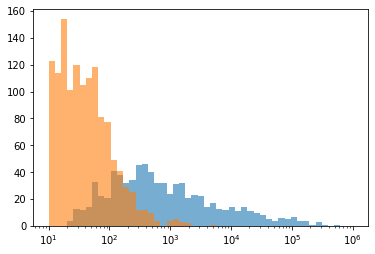

In [173]:
allCounts = np.concatenate((mligCounts,
                            smanCounts,
                            smedCounts))
# Count number of pfms included in each cluster
cNMembers = np.zeros_like(cCounts)
# Count total number of seqlets for each cluster
cNSeqlets = np.zeros_like(cCounts)
# Get length of each pfm centroid
cLens = np.zeros_like(cCounts)
for i, n in enumerate(cNames):
    cLens[i] = cPFMs[n].shape[0]
    cNMembers[i] = (cl==i).sum()
    cNSeqlets[i] = allCounts[cl==i].sum()

# Check how many clusters are over 4 bases long and ...
# have more than one supporting member or ...
cFilter = (cNMembers > 1) & (cLens > 4)
print( '{0} motif clusters have more than one member'.format(cFilter.sum()) )
# have more than 100 supporting seqlets
cFilter = cFilter | ((cNSeqlets >= 100) & (cLens > 4))
print( ('{0} motif clusters have more than one member '\
       +'or have more than 100 supporting seqlets').format(cFilter.sum()) )
bins = np.logspace(1,6,50)
plt.hist( cNSeqlets[cNMembers>1], bins=bins, alpha=0.6 )
plt.hist( cNSeqlets[cNMembers==1], bins=bins, alpha=0.6 )
plt.xscale('log')
plt.show()

In [174]:
writeMEME( cPFMs, 'motif_clustering_data/modisco_clusters.meme', 
           np.array(cNames)[cFilter], cNSeqlets[cFilter] )

In [160]:
# Do the same thing with all of the JASPAR motifs
if os.path.exists( 'motif_clustering_data/jaspar_cluster_pfms.pkl' ):
    print( 'loading existing data' )
    jCl = np.load( 'motif_clustering_data/jaspar_pfm_cluster_ids.npy' )
    jcNames = np.load( 'motif_clustering_data/jaspar_cluster_names.npy' )
    jcCounts = np.load( 'motif_clustering_data/jaspar_cluster_n_seqlets.npy' )
    with open( 'motif_clustering_data/jaspar_cluster_pfms.pkl', 'rb' ) as f:
        jcPFMs = pk.load( f )
else:
    jCl, jcPFMs, jcNames, jcCounts = radialCorrClusterPFMs( jDists, jasparPFMs,    
                                                            jasparNames, weights=None, 
                                                            prefix='JC_', trim=0.2,
                                                            corrThresh=0 )
    np.save( 'motif_clustering_data/jaspar_pfm_cluster_ids.npy', jCl )
    np.save( 'motif_clustering_data/jaspar_cluster_names.npy', jcNames )
    np.save( 'motif_clustering_data/jaspar_cluster_n_seqlets.npy', jcCounts )
    with open( 'motif_clustering_data/jaspar_cluster_pfms.pkl', 'wb' ) as f:
        pk.dump( jcPFMs, f )

Clustering 1646 motifs, 1353835.0 possible pairs
Current correlation cutoff: 0.9991627430235188
Current maximum correlation: 0.9999999999999998
Current minimum distance: 0.0
Attempted to merge 390 cluster pairs; 388 successes
Clustering 1258 motifs, 790651.0 possible pairs
Current correlation cutoff: 0.9984849137106455
Current maximum correlation: 0.9990008688378014
Current minimum distance: 0.009950613959107844
Attempted to merge 225 cluster pairs; 215 successes
Clustering 1043 motifs, 543391.0 possible pairs
Current correlation cutoff: 0.9983362048322721
Current maximum correlation: 0.998338944608597
Current minimum distance: 0.03279519677865149
Attempted to merge 153 cluster pairs; 136 successes
Clustering 907 motifs, 410842.0 possible pairs
Current correlation cutoff: 0.9981227121369203
Current maximum correlation: 0.9984396583162392
Current minimum distance: 0.03511172093697164
Attempted to merge 105 cluster pairs; 87 successes
Clustering 820 motifs, 335743.0 possible pairs
Curren

/tmp/ipykernel_32730/1445189306.py:136: RuntimeWarning: divide by zero encountered in log2
  pfm = trimPFM( pfm, trim, bkgGC=bkgGC )


In [177]:
u, c = np.unique(jCl,return_counts=True)
print(len(u))
u[np.argsort(c)[::-1]][:20]

429


array([ 47,  65,   0,  14, 189, 117, 314, 183, 304,  12, 335, 297, 224,
        71,  67, 239, 190,  66, 104, 232])

In [175]:
writeMEME( jcPFMs, 
           'motif_clustering_data/jaspar_clustered_pfms.meme', 
           jcNames,jcCounts )

## QC

In [ ]:
! tomtom -text -dist kullback motif_clustering_data/modisco_clusters.meme jaspar_clustered_pfms.meme > motif_clustering_data/modisco_vs_jaspar_tomtom.tsv

In [ ]:
# check for any MoDISco motif clusters which have a potential
# tomtom hit in the JASPAR clusters
tomtom = pd.read_table( 'motif_clustering_data/modisco_vs_jaspar_tomtom.tsv' )
tomtom = tomtom.loc[tomtom['q-value']<0.05]
print( '{0}/{1} MODISCO motif clusters '.format(tomtom.Query_ID.nunique(),
                                                cFilter.sum())
      +'map to {0}/{1} JASPAR motif clusters'.format(tomtom.Target_ID.nunique(),
                                                     nJC) )
tomtom = tomtom.drop(['Optimal_offset','Overlap','Query_consensus',
                      'Target_consensus','Orientation'],axis=1)
tomtom = tomtom.set_index(['Query_ID','Target_ID'])
tomtom = tomtom.sort_values(by='q-value')
tomtom.index.names = ['MODISCO_ID','JASPAR_ID']
tomtom.head()

In [ ]:
! tomtom -text -dist kullback jaspar_clustered_pfms.meme motif_clustering_data/modisco_clusters.meme > motif_clustering_data/jaspar_vs_modisco_tomtom.tsv

In [324]:
# look for reverse hits as well
tomtom2 = pd.read_table( 'motif_clustering_data/jaspar_vs_modisco_tomtom.tsv' )
tomtom2 = tomtom2.loc[tomtom2['q-value']<0.05]
print( '{0}/{1} MODISCO motif clusters '.format(tomtom2.Target_ID.nunique(),
                                                cFilter.sum())
      +'map to {0}/{1} JASPAR motif clusters'.format(tomtom2.Query_ID.nunique(),
                                                     nJC) )
tomtom2 = tomtom2.drop(['Optimal_offset','Overlap','Query_consensus',
                        'Target_consensus','Orientation'],axis=1)
tomtom2 = tomtom2.set_index(['Target_ID','Query_ID'])
tomtom2 = tomtom2.sort_values(by='q-value')
tomtom2.index.names = ['MODISCO_ID','JASPAR_ID']
tomtom2.head()

417/992 MODISCO motif clusters map to 114/429 JASPAR motif clusters


p-value       E-value       q-value
MODISCO_ID JASPAR_ID                                          
WC_1276    JC_0350    1.031020e-19  1.022770e-16  2.015400e-16
           JC_0349    1.519110e-19  1.506960e-16  2.930810e-16
WC_0508    JC_0349    1.756810e-18  1.742760e-15  1.694700e-15
           JC_0350    1.005700e-13  9.976540e-11  9.829570e-11
WC_0748    JC_0280    2.450960e-13  2.431350e-10  4.852660e-10

In [327]:
# narrow in on bi-directional hits as potential redundancies
tomtom = tomtom.loc[tomtom.index.isin(tomtom2.index),:].reset_index(drop=False)

print( '{0}/{1} MODISCO motif clusters '.format(tomtom.MODISCO_ID.nunique(),
                                                cFilter.sum())
      +'map to {0}/{1} JASPAR motif clusters'.format(tomtom.JASPAR_ID.nunique(),
                                                     nJC) )

225/992 MODISCO motif clusters map to 99/429 JASPAR motif clusters


In [185]:
tomtom.groupby('Query_ID')['q-value'].min().sort_values().index

Index(['WC_0508', 'WC_1276', 'WC_0748', 'WC_0039', 'WC_0050', 'WC_0972',
       'WC_0918', 'WC_1041', 'WC_0967', 'WC_0984',
       ...
       'WC_0183', 'WC_1635', 'WC_0579', 'WC_0118', 'WC_1465', 'WC_1319',
       'WC_0855', 'WC_0270', 'WC_0520', 'WC_0231'],
      dtype='object', name='Query_ID', length=182)

/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/logomaker/src/Logo.py:194: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 1, figsize=self.figsize)


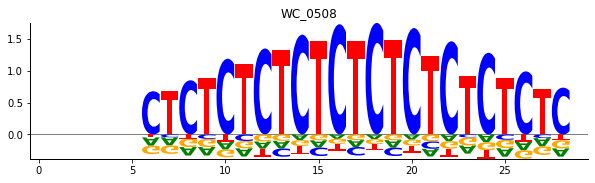

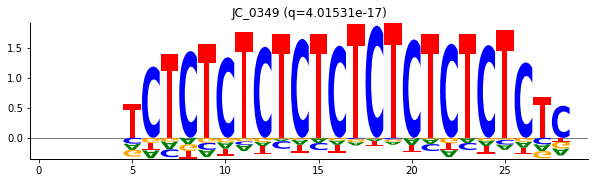

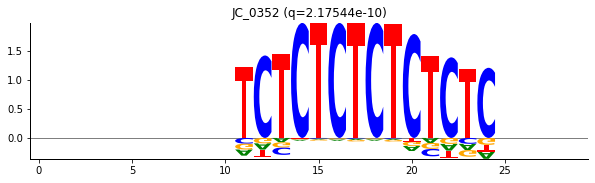

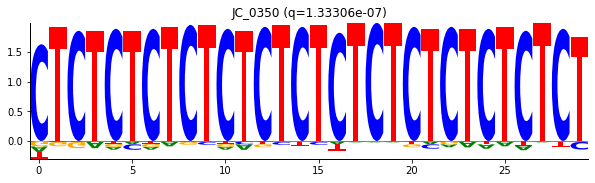

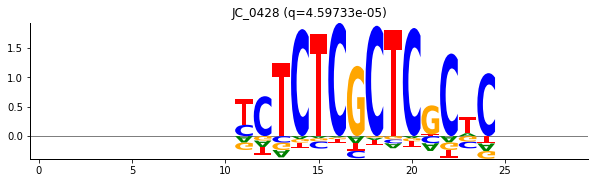

...

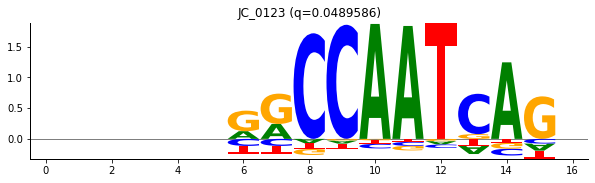

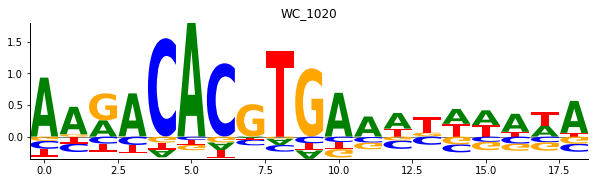

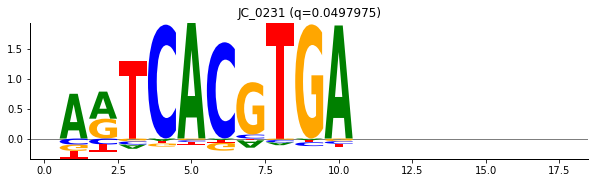

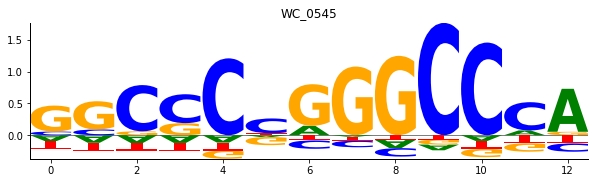

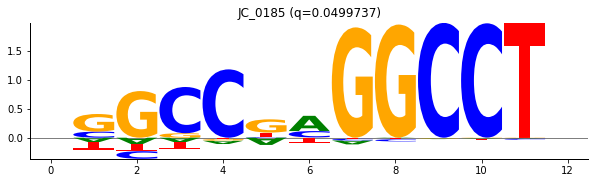

In [328]:
# output the mapped pairs so we can manually examine them
candidates = tomtom.groupby('MODISCO_ID')['q-value'].min().sort_values().index
p = PdfPages( 'motif_clustering_data/modisco_jaspar_cluster_matches_tomtom.pdf' )
for i, targ in enumerate(candidates):
    targPFM = cPFMs[targ]
    sub = tomtom[tomtom.MODISCO_ID==targ].sort_values(by='q-value')
    hitP = sub['q-value'].values
    hitNames = sub.JASPAR_ID.values
    hitPFMs = [ jcPFMs[n] for n in hitNames ]
    align = generatePFMAlignment( targPFM, hitPFMs )
    for j in range(align.shape[-1]):
        f = makeLogoFromPFM( align[:,:,j] ).fig
        if j == 0:
            f.gca().set_title('{0}'.format(targ))
        else:
            f.gca().set_title('{0} (q={1})'.format(hitNames[j-1],
                                                   hitP[j-1]))
        f.savefig( p, format='pdf' )
p.close()

In [383]:
# remove the motifs which we think have a good hit to JASPAR motifs
# but keep the ones that we manually think are unique enough
keep = cFilter & ~np.isin(cNames,tomtom.MODISCO_ID.unique())
with open( 'motif_clustering_data/rescue_motif_clusters.txt', 'r') as f:
    toRescue = np.array([l.strip() for l in f.readlines()])
    print( 'Saving {0} motifs'.format(toRescue.shape[0]) )
keep = keep | np.isin(cNames,toRescue)
print( '{0} potentially novel motif clusters'.format(keep.sum()) )

Saving 73 motifs
840 potentially novel motif clusters


In [384]:
# map all of the cluster pfms to the raw 
# JASPAR motifs for naming purposes
finalNames = np.concatenate((jcNames,np.array(cNames)[keep]))
jMap = np.zeros((len(jasparNames),len(finalNames)))
for i in tqdm(range(len(finalNames))):
    base = {**jcPFMs,**cPFMs}[finalNames[i]]
    for j in range(len(jasparNames)):
        other = jasparPFMs[jasparNames[j]]
        dist, _, _ = bestOverlapPFMs( base, other, overlap='complete', agg='sum' )
        jMap[j,i] = dist
bestHits = jasparNames[np.argmin(jMap,axis=0).flatten()]
print( bestHits[:10] )

100%|████████████████████████████████████████████████████████████| 1269/1269 [13:26<00:00,  1.57it/s]

['MA0965.1' 'MA0067.1' 'MA0010.1' 'MA0011.1' 'MA0317.1' 'MA0040.1'
 'MA0379.1' 'MA0016.1' 'MA0019.1' 'MA0064.1']


In [385]:
jasparMap = {}
with open( 'motif_clustering_data//JASPAR2020_CORE_non-redundant_pfms_meme.txt', 'r' ) as f:
    for line in f.readlines():
        if 'MOTIF' in line:
            info = line.strip().split()
            jasparMap[info[1]] = info[2].replace(':','-')
bestHitNames = np.array([jasparMap[n] for n in bestHits])
print( bestHitNames[:10] )
bestDists = np.min(jMap,axis=0).flatten()

['BIM2' 'Pax2' 'br' 'br(var.2)' 'HCM1' 'Foxq1' 'MOT2' 'usp' 'Ddit3--Cebpa'
 'PBF']


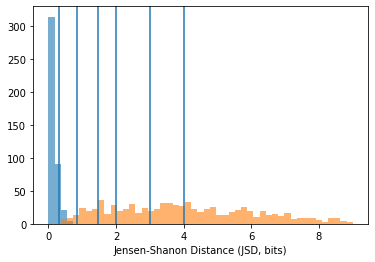

array(['JC_0000|BIM2(0.105)', 'JC_0001|Pax2(0.321)', 'JC_0002|br(0.006)',
       ..., 'WC_2049|CUP2(5.215)', 'WC_2050|ZSCAN4(5.930)',
       'WC_2051|SCRT2(4.452)'], dtype='<U34')

In [13]:
# update cluster names with most similar JASPAR motif name
# and total JSD value between the two pfms
outNames = []
outPFMs = {}
for i, name in enumerate(finalNames):
    hit = bestHitNames[i]
    dist = bestDists[i]
    outName = name + '|{0}({1:.3f})'.format(hit,dist)
    outNames.append(outName)
    outPFMs[outName] = {**jcPFMs,**cPFMs}[name]
outNames = np.array(outNames)
# plot the total JSD values to the most similar hits
bins = np.linspace(0,9,50)
plt.hist( bestDists[:nJC], bins=bins, alpha=0.6, label='JC' )
plt.hist( bestDists[nJC:], bins=bins, alpha=0.6, label='WC' )

# Find where to plot the example motifs
targets = [ 'JC_0057', # NR4A1
            'WC_1094', # NR4A1-like
            'WC_1100', 'WC_0047', 'WC_0328', 'WC_1574' ]
ids = np.array([cl.split('|')[0] for cl in outNames])
plotDists = bestDists[np.isin(ids,targets)]
for d in plotDists:
    plt.axvline( d )

plt.xlabel( 'Jensen-Shanon Distance (JSD, bits)' )
plt.savefig( 'Plots/Fig2/Panel2d.svg', format='svg' )
plt.show()
outNames

In [387]:
writeMEME( outPFMs, 'motif_clustering_data/all_motif_clusters.annot.meme', outNames )

In [3]:
outPFMs, outNames = readMEME( 'motif_clustering_data/all_motif_clusters.annot.meme' )
outNames = np.array(outNames)